Imports

In [2]:
import zipfile
import os
import shutil

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import cv2

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
shutil.copyfile('/content/drive/MyDrive/Datasets/agyikepek_4_osztaly.zip', '/content/mri_scans.zip')

'/content/mri_scans.zip'

In [5]:
with zipfile.ZipFile('/content/mri_scans.zip', 'r') as zip_ref:
  zip_ref.extractall('/content/mri_scans')

shutil.copytree('/content/mri_scans/agyikepek_4_osztaly', '/content/dataset')

'/content/dataset'

In [6]:
print(["{}: {}".format(root, len(files)) for root, dirs, files in os.walk("dataset/Training")])
print(["{}: {}".format(root, len(files)) for root, dirs, files in os.walk("dataset/Testing")])

['dataset/Training: 0', 'dataset/Training/pituitary: 1344', 'dataset/Training/glioma: 1321', 'dataset/Training/meningioma: 1339', 'dataset/Training/notumor: 1595']
['dataset/Testing: 0', 'dataset/Testing/pituitary: 300', 'dataset/Testing/glioma: 300', 'dataset/Testing/meningioma: 306', 'dataset/Testing/notumor: 405']


Read Images with Preprocessing

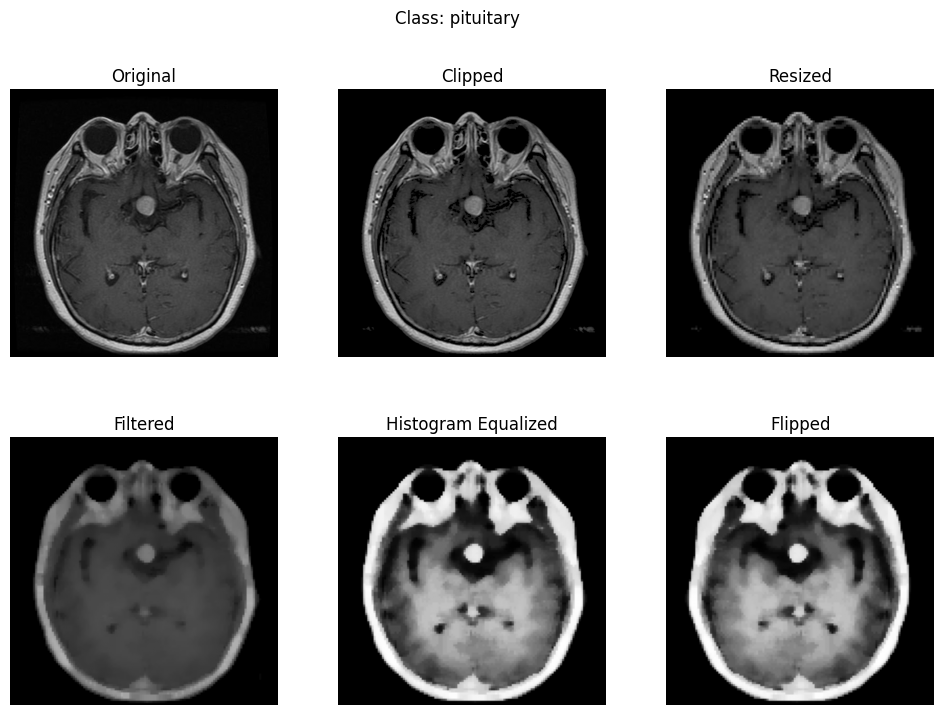

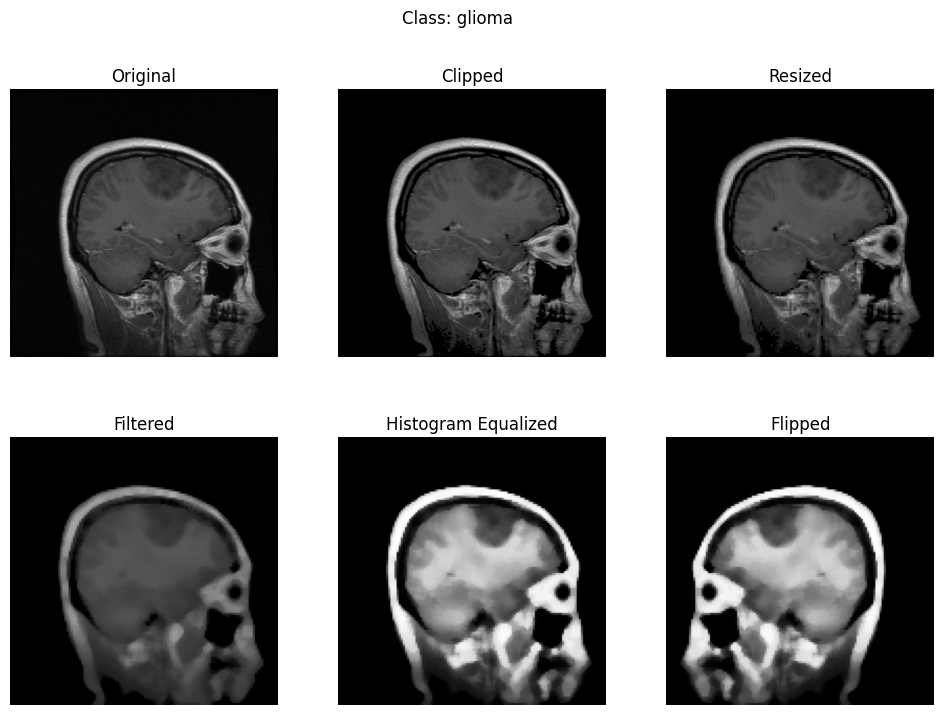

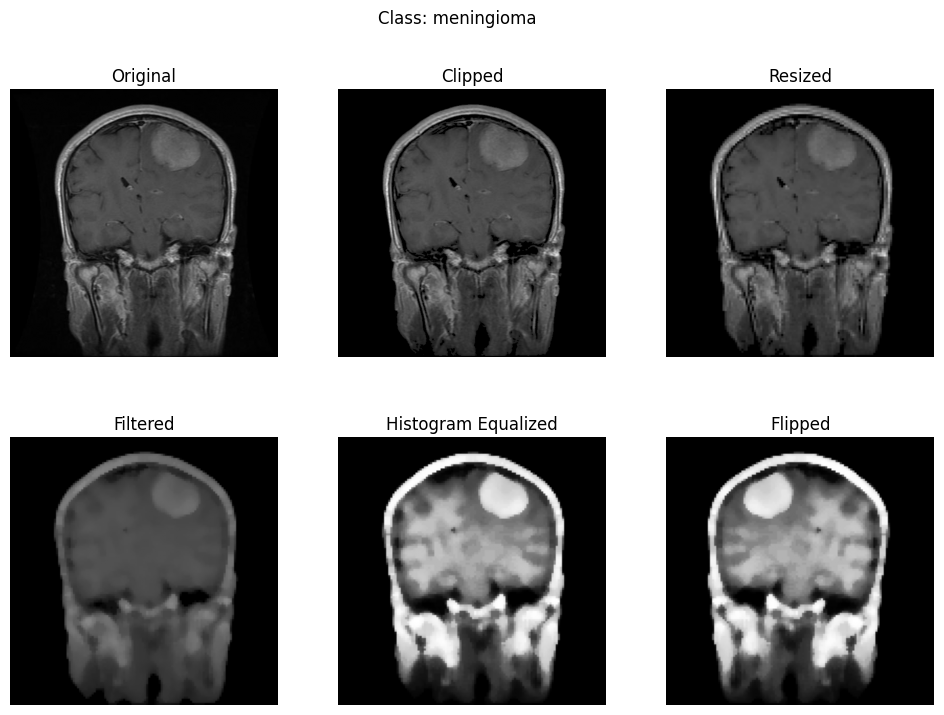

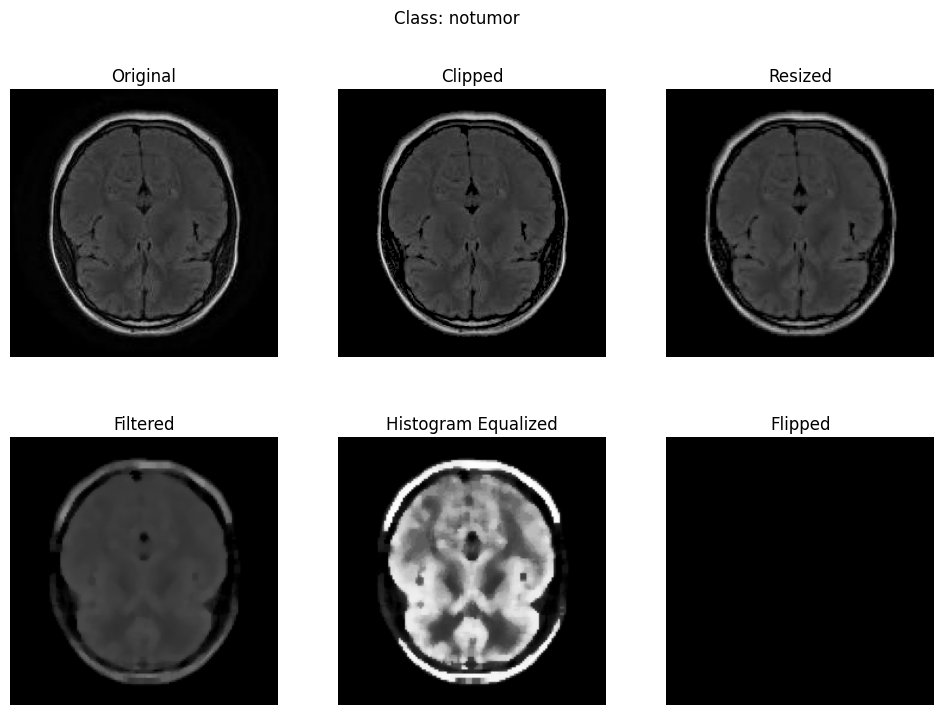

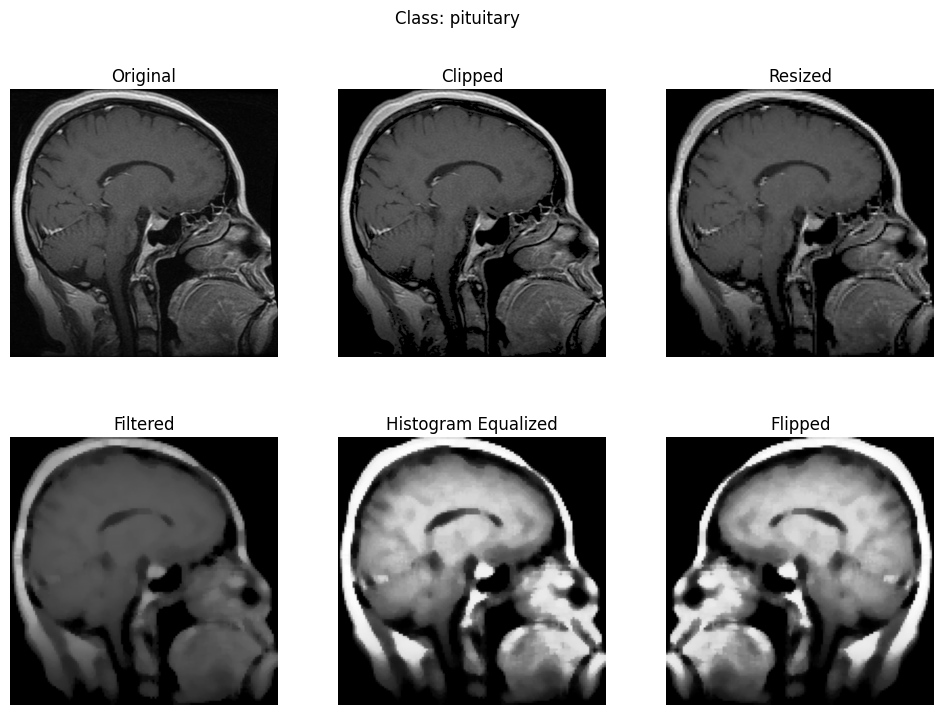

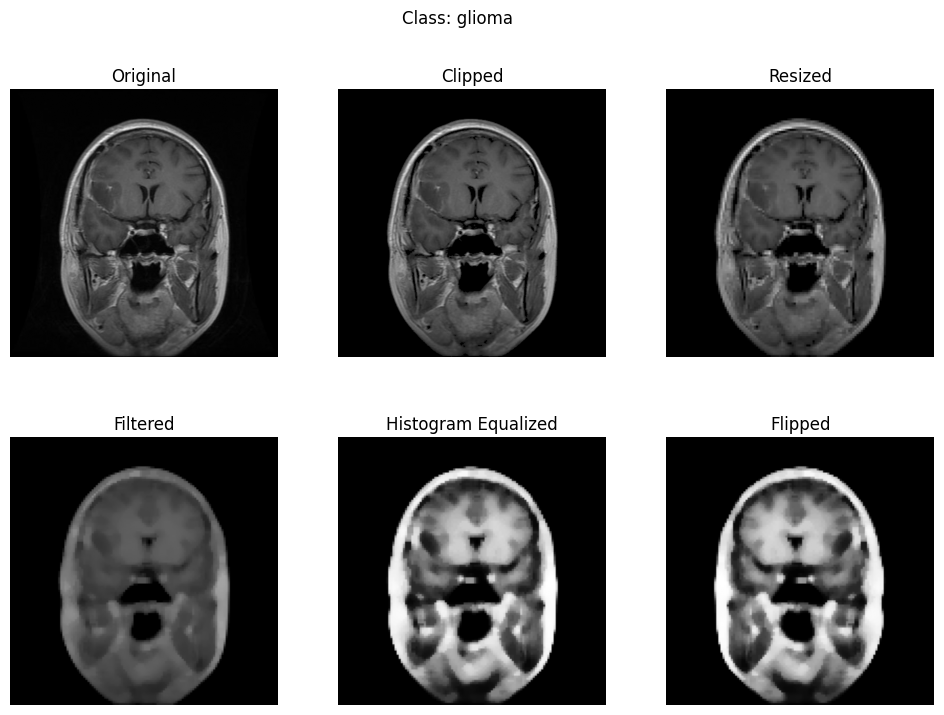

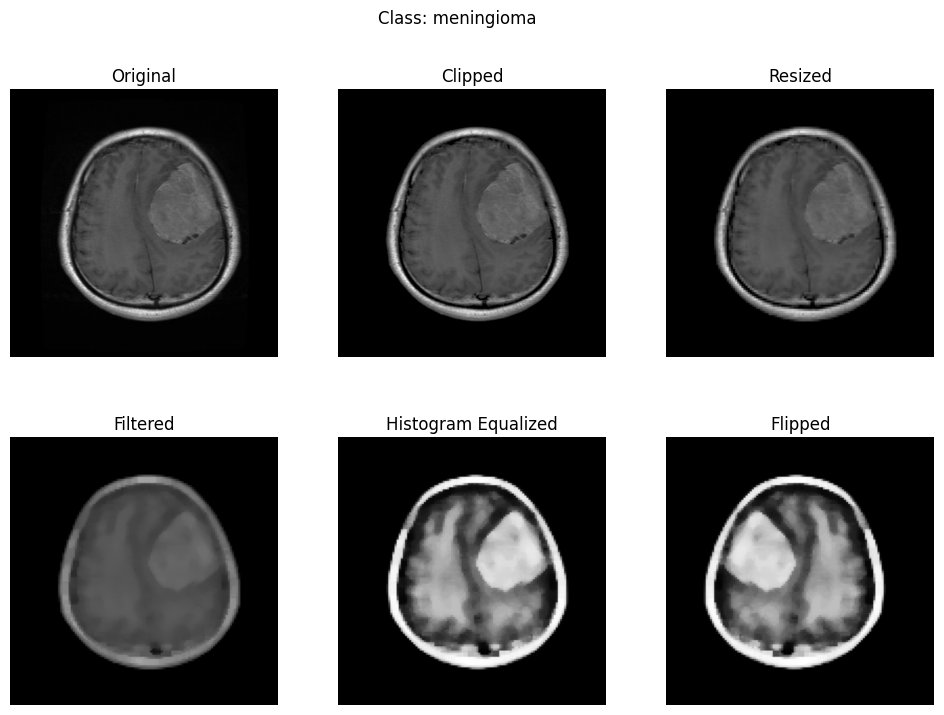

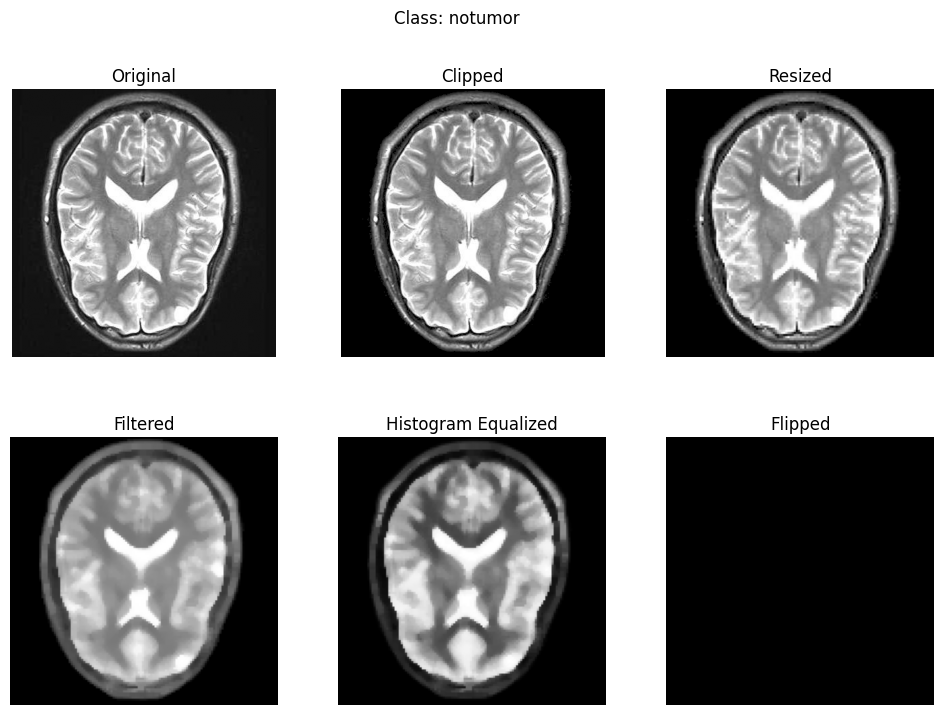

First training sample: Image shape: (16384,), Label: pituitary
Number of training samples: 9603
Number of testing samples: 1311


In [7]:
main_directory = 'dataset'
train_directory = os.path.join(main_directory, 'Training')
test_directory = os.path.join(main_directory, 'Testing')

def load_images_and_labels(folder_path, filter_size=5, threshold_value=30, resolution = 128, add_flipped = True):
    data = []
    class_names = os.listdir(folder_path)

    for class_name in class_names:
        class_folder = os.path.join(folder_path, class_name)

        if os.path.isdir(class_folder):
            display_count = 0

            for img_name in os.listdir(class_folder):

                img_path = os.path.join(class_folder, img_name)
                try:
                    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

                    if img is not None:
                        images = []

                        # Clipping
                        img_clipped = np.where(img >= threshold_value, img, 0).astype(np.uint8)
                        images.append(img_clipped.copy())

                        # Resizing
                        img_resized = cv2.resize(img_clipped, (resolution, resolution))
                        images.append(img_resized.copy())

                        # Median filter
                        img_filtered = cv2.medianBlur(img_resized, filter_size)
                        images.append(img_filtered.copy())

                        # Histogram Equalization
                        img_equalized = cv2.equalizeHist(img_filtered)
                        images.append(img_equalized.copy())

                        # If it's "notumor", add a black image as placeholder for the flipped image
                        if class_name == "notumor":
                            black_image = np.zeros_like(img_equalized)  # Create a black image of the same size
                            images.append(black_image)  # Append the black image as the flipped version
                        else:
                            # Flip the image only if the label is not "notumor"
                            img_flipped = cv2.flip(img_equalized, 1)  # Flip horizontally
                            images.append(img_flipped.copy())
                            img_flipped_normalized = img_flipped.astype(np.float32) / 255.0

                        # Normalize + Flatten
                        img_normalized = img_equalized.astype(np.float32) / 255.0

                        data.append((img_normalized.flatten(), class_name))
                        if add_flipped and class_name != "notumor":  # Only add flipped image for tumor classes
                            data.append((img_flipped_normalized.flatten(), class_name))

                        if display_count < 1:
                            images.insert(0, img.copy())
                            display_image(images, class_name)
                            display_count += 1

                    else:
                        print(f"Could not read image {img_path}")

                except Exception as e:
                    print(f"Error reading image {img_path}: {e}")

    return data

def display_image(images, class_name):
    titles = [
        "Original",
        "Clipped",
        "Resized",
        "Filtered",
        "Histogram Equalized",
        "Flipped"
    ]

    fig, axes = plt.subplots(2, 3, figsize=(12, 8))
    fig.subplots_adjust(hspace=0.3, wspace=0.2)

    fig.suptitle(f"Class: {class_name}")

    for i, ax in enumerate(axes.flat):
        ax.imshow(images[i], cmap='gray', vmin=0, vmax=255)
        ax.set_title(titles[i])
        ax.axis('off')

    plt.show()

resolution = 128
train_data = load_images_and_labels(train_directory, add_flipped=True, resolution=resolution)
test_data = load_images_and_labels(test_directory, add_flipped=False, resolution=resolution)

print(f"First training sample: Image shape: {train_data[0][0].shape}, Label: {train_data[0][1]}")

print(f"Number of training samples: {len(train_data)}")
print(f"Number of testing samples: {len(test_data)}")

In [33]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

imsize = 224
#imsize = 64 #CPU

data_gen = ImageDataGenerator(rescale=1./255, featurewise_std_normalization=True, validation_split=0.2)
batch_size = 64

train_data = data_gen.flow_from_directory("dataset/Training",
                                           target_size=(imsize, imsize),
                                           batch_size=batch_size,
                                           color_mode='rgb',
                                           class_mode="categorical",
                                           subset='training',         # Specify training subset
                                           seed=42 )                  # Ensure reproducibility

valid_data = data_gen.flow_from_directory("dataset/Testing",
                                           target_size=(imsize, imsize),
                                           batch_size=batch_size,
                                           color_mode='rgb',
                                           class_mode="categorical",
                                           subset='validation',       # Specify validation subset
                                           seed=42 )                  # Ensure reproducibility

Found 4481 images belonging to 4 classes.
Found 262 images belonging to 4 classes.


/usr/local/lib/python3.11/dist-packages/keras/src/legacy/preprocessing/image.py:1063: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, which overrides setting of `featurewise_center`.
  warnings.warn(


Custom Model

In [9]:
param_num = imsize * imsize

from keras.models import Sequential
from keras.layers import Conv2D, MaxPool2D, Dropout, Dense, Flatten

model = Sequential()
model.add(Conv2D(32, (5, 5), input_shape=(imsize, imsize, 1)))
model.add(Dropout(0.25))
model.add(MaxPool2D((2, 2)))
model.add(Conv2D(64, (3, 3)))
model.add(Dropout(0.25))
model.add(MaxPool2D((2, 2)))
model.add(Conv2D(128, (3, 3)))
model.add(Dropout(0.25))
model.add(MaxPool2D((2, 2)))
model.add(Flatten())
model.add(Dense(400, activation='relu'))
model.add(Dropout(0.25))
model.add(Dense(400, activation='relu'))
model.add(Dense(4, activation='sigmoid'))

model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

model.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 220, 220, 32)        │             832 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 220, 220, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 110, 110, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 108, 108, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 108, 108, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 52, 52, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 52, 52, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 86528)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 400)                 │      34,611,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 400)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 400)                 │         160,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 4)                   │           1,604 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 34,866,788 (133.01 MB)

 Trainable params: 34,866,788 (133.01 MB)

 Non-trainable params: 0 (0.00 B)

Transfer learning (ResNet)

In [34]:
from tensorflow.keras.applications import ResNet50V2

model = ResNet50V2(include_top=True, weights="imagenet", classes=1000)
model.summary()

Model: "resnet50v2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3             │ (None, 224, 224, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_pad (ZeroPadding2D) │ (None, 230, 230, 3)    │              0 │ input_layer_3[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 112, 112, 64)   │          9,472 │ conv1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pad (ZeroPadding2D) │ (None, 114, 114, 64)   │              0 │ conv1_conv[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pool (MaxPooling2D) │ (None, 56, 56, 64)     │              0 │ pool1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_preact_bn    │ (None, 56, 56, 64)     │            256 │ pool1_pool[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_preact_relu  │ (None, 56, 56, 64)     │              0 │ conv2_block1_preact_b… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 56, 56, 64)     │          4,096 │ conv2_block1_preact_r… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_pad        │ (None, 58, 58, 64)     │              0 │ conv2_block1_1_relu[0… │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 56, 56, 64)     │         36,864 │ conv2_block1_2_pad[0]… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_2_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_2_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_conv  

 Total params: 25,613,800 (97.71 MB)

 Trainable params: 25,568,360 (97.54 MB)

 Non-trainable params: 45,440 (177.50 KB)

In [35]:
train_layers = 154
model.layers[train_layers].name

'conv5_block1_preact_bn'

In [36]:
for l in model.layers[:train_layers]:
    l.trainable = False

In [37]:
print(model.layers[train_layers-1].trainable)
print(model.layers[train_layers].trainable)

False
True


In [38]:
from keras.layers import Dense
from keras.models import Model

utolsoelotti = model.layers[-2]
ujutolso = Dense(4, activation='sigmoid')(utolsoelotti.output)

newmodel = Model(inputs=model.input, outputs=ujutolso)

In [39]:
newmodel.summary()

Model: "functional_17"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3             │ (None, 224, 224, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_pad (ZeroPadding2D) │ (None, 230, 230, 3)    │              0 │ input_layer_3[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 112, 112, 64)   │          9,472 │ conv1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pad (ZeroPadding2D) │ (None, 114, 114, 64)   │              0 │ conv1_conv[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pool (MaxPooling2D) │ (None, 56, 56, 64)     │              0 │ pool1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_preact_bn    │ (None, 56, 56, 64)     │            256 │ pool1_pool[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_preact_relu  │ (None, 56, 56, 64)     │              0 │ conv2_block1_preact_b… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 56, 56, 64)     │          4,096 │ conv2_block1_preact_r… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_pad        │ (None, 58, 58, 64)     │              0 │ conv2_block1_1_relu[0… │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 56, 56, 64)     │         36,864 │ conv2_block1_2_pad[0]… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_2_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_2_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_conv  

 Total params: 23,572,996 (89.92 MB)

 Trainable params: 14,979,076 (57.14 MB)

 Non-trainable params: 8,593,920 (32.78 MB)

In [41]:
model = newmodel

model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

In [31]:
import tensorflow as tf
import datetime

logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)



In [11]:
%load_ext tensorboard

In [12]:
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

In [42]:
from keras.callbacks import EarlyStopping

early_stopping = EarlyStopping(monitor='val_loss', patience=3, verbose=1, restore_best_weights=True)

history = model.fit(train_data,
          validation_data=valid_data,
          epochs=10,
          callbacks=[tensorboard_callback, early_stopping])

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
71/71 ━━━━━━━━━━━━━━━━━━━━ 69s 536ms/step - accuracy: 0.8548 - loss: 0.1781 - val_accuracy: 0.7939 - val_loss: 3.2006
Epoch 2/10
71/71 ━━━━━━━━━━━━━━━━━━━━ 24s 334ms/step - accuracy: 0.9703 - loss: 0.0437 - val_accuracy: 0.9122 - val_loss: 1.0468
Epoch 3/10
71/71 ━━━━━━━━━━━━━━━━━━━━ 25s 349ms/step - accuracy: 0.9878 - loss: 0.0224 - val_accuracy: 0.8626 - val_loss: 1.3204
Epoch 4/10
71/71 ━━━━━━━━━━━━━━━━━━━━ 40s 331ms/step - accuracy: 0.9841 - loss: 0.0228 - val_accuracy: 0.9389 - val_loss: 1.0298
Epoch 5/10
71/71 ━━━━━━━━━━━━━━━━━━━━ 41s 336ms/step - accuracy: 0.9950 - loss: 0.0083 - val_accuracy: 0.9313 - val_loss: 0.5836
Epoch 6/10
71/71 ━━━━━━━━━━━━━━━━━━━━ 23s 322ms/step - accuracy: 0.9965 - loss: 0.0062 - val_accuracy: 0.9466 - val_loss: 0.2483
Epoch 7/10
71/71 ━━━━━━━━━━━━━━━━━━━━ 23s 317ms/step - accuracy: 0.9922 - loss: 0.0176 - val_accuracy: 0.8931 - val_loss: 0.3602
Epoch 8/10
71/71 ━━━━━━━━━━━━━━━━━━━━ 23s 326ms/step - accuracy: 0.9945 - loss: 0.0092 - val_accu